<a href="https://colab.research.google.com/github/mahfuz-raihan/project_sports_player_instance_segmenations/blob/main/sports_project_resnet101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
print(torch.__version__)

1.12.1+cu113


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## install pytorch version suitable to detectron2

In [2]:
pip install torch==1.10.0+cu102 torchvision==0.11.0+cu102 torchaudio==0.10.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |██████████████████████████████▎ | 834.1 MB 1.2 MB/s eta 0:00:41tcmalloc: large alloc 1147494400 bytes == 0x3a4fa000 @  0x7fa51dc7a615 0x58e046 0x4f2e5e 0x4d19df 0x51b31c 0x5b41c5 0x58f49e 0x51b221 0x5b41c5 0x58f49e 0x51837f 0x4cfabb 0x517aa0 0x4cfabb 0x517aa0 0x4cfabb 0x517aa0 0x4ba70a 0x538136 0x590055 0x51b180 0x5b41c5 0x58f49e 0x51837f 0x5b41c5 0x58f49e 0x51740e 0x58f2a7 0x517947 0x5b41c5 0x58f49e
     |████████████████████████████████| 881.9 MB 19 kB/s 
     |████████████████████████████████| 23.2 MB 1.2 MB/s 
     |████████████████████████████████| 2.7 MB 63.3 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvisio

## install detectron2

In [3]:
pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.10/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.10/index.html
     |████████████████████████████████| 6.5 MB 547 kB/s 
     |████████████████████████████████| 130 kB 42.5 MB/s 
     |████████████████████████████████| 151 kB 59.2 MB/s 
     |████████████████████████████████| 50 kB 7.4 MB/s 
     |████████████████████████████████| 79 kB 8.0 MB/s 
     |████████████████████████████████| 843 kB 56.1 MB/s 
     |████████████████████████████████| 117 kB 66.6 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=093d07d8c3bf7266b0641098c204e5c994c3cc0437dcd5b024785e8797b075c4
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=615440f67f23c61f97

## start

In [1]:
import torch, detectron2
print('pytorch version:',torch.__version__)
print('detectron2 version:',detectron2.__version__)

pytorch version: 1.10.0+cu102
detectron2 version: 0.6


## ## now, import dependencies and library

In [2]:
# detectron2 logger
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# common libraries
import numpy as np
import os, json, cv2, random 
import matplotlib.pyplot as plt
%matplotlib inline

# detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

In [3]:
# check the trained dataset in the detectron2
DatasetCatalog.list()

['coco_2014_train',
 'coco_2014_val',
 'coco_2014_minival',
 'coco_2014_minival_100',
 'coco_2014_valminusminival',
 'coco_2017_train',
 'coco_2017_val',
 'coco_2017_test',
 'coco_2017_test-dev',
 'coco_2017_val_100',
 'keypoints_coco_2014_train',
 'keypoints_coco_2014_val',
 'keypoints_coco_2014_minival',
 'keypoints_coco_2014_valminusminival',
 'keypoints_coco_2014_minival_100',
 'keypoints_coco_2017_train',
 'keypoints_coco_2017_val',
 'keypoints_coco_2017_val_100',
 'coco_2017_train_panoptic_separated',
 'coco_2017_train_panoptic_stuffonly',
 'coco_2017_train_panoptic',
 'coco_2017_val_panoptic_separated',
 'coco_2017_val_panoptic_stuffonly',
 'coco_2017_val_panoptic',
 'coco_2017_val_100_panoptic_separated',
 'coco_2017_val_100_panoptic_stuffonly',
 'coco_2017_val_100_panoptic',
 'lvis_v1_train',
 'lvis_v1_val',
 'lvis_v1_test_dev',
 'lvis_v1_test_challenge',
 'lvis_v0.5_train',
 'lvis_v0.5_val',
 'lvis_v0.5_val_rand_100',
 'lvis_v0.5_test',
 'lvis_v0.5_train_cocofied',
 'lvis_v0.

### **optional**

In [ ]:
# remove the dataset if needed
if train_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(train_dataset_name)

if test_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(test_dataset_name)
if val_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(val_dataset_name)

## register the dataset in detectorn2

In [4]:
from detectron2.data.datasets import register_coco_instances
config_file_path = 'COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml'
checkpoint_url = 'COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml'

#train define
train_dataset_name = 'sports_coco_train_res101'
train_images_path = '/content/drive/MyDrive/project_dataset/train'
train_json_path = '/content/drive/MyDrive/project_dataset/sports_train.json'

# val define
test_dataset_name = 'sports_coco_test_res101'
test_images_path = '/content/drive/MyDrive/project_dataset/test'
test_json_path = '/content/drive/MyDrive/project_dataset/sports_test.json'


# val define
val_dataset_name = 'sports_coco_val_res101'
val_images_path = '/content/drive/MyDrive/project_dataset/val'
val_json_path = '/content/drive/MyDrive/project_dataset/sports_val.json'

register_coco_instances(
    name = train_dataset_name,
    metadata={},
    json_file = train_json_path,
    image_root = train_images_path
)
register_coco_instances(
    name = val_dataset_name,
    metadata = {},
    json_file = val_json_path,
    image_root = val_images_path
)
register_coco_instances(
    name = test_dataset_name,
    metadata = {},
    json_file = test_json_path,
    image_root = test_images_path
)

In [5]:
# let's plot some random picture
def plot_samples(dataset_name, n = 3):
    dataset_custom = DatasetCatalog.get(dataset_name)
    dataset_custom_metadata = MetadataCatalog.get(dataset_name)

    for i in random.sample(dataset_custom, n):
        img = cv2.imread(i['file_name'])
        v = Visualizer(img[:,:,::-1], metadata = dataset_custom_metadata, scale = 0.5)
        v = v.draw_dataset_dict(i)
        plt.figure(figsize=(6, 9))
        plt.imshow(v.get_image())
        plt.show()

[09/25 22:45:35 d2.data.datasets.coco]: Loaded 106 images in COCO format from /content/drive/MyDrive/project_dataset/sports_test.json


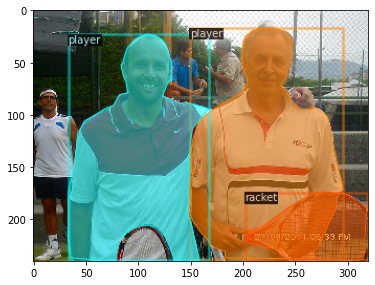

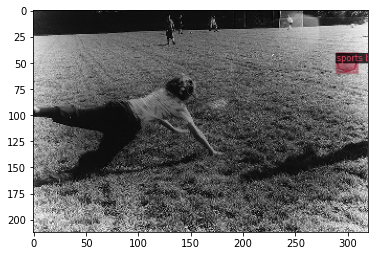

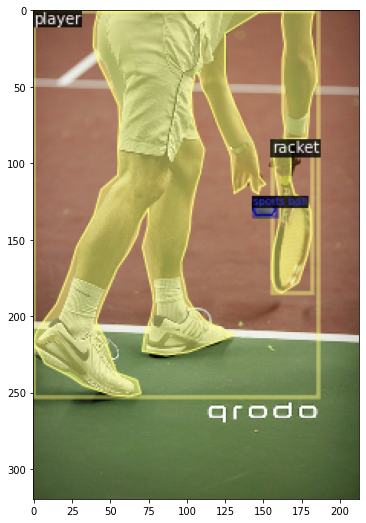

In [6]:
plot_samples(test_dataset_name)

## Image segmentation and train

In [8]:
import pickle
output_dir = '/content/drive/MyDrive/project_dataset/output_resnet101/segmentation_res101'
num_classes = 7

device = 'cuda' # cpu

cfg_save_path = "/content/drive/MyDrive/project_dataset/output_resnet101/IS_res101_cfg.pickle"


def get_train_cfg(config_file_path, checkpoint_url, train_dataset_name, test_dataset_name, num_classes, device, output_dir):
    cfg = get_cfg()

    cfg.merge_from_file(model_zoo.get_config_file(config_file_path))
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(checkpoint_url)
    cfg.DATASETS.TRAIN = (train_dataset_name,)
    cfg.DATASETS.TEST = ()
    cfg.DATALOADER.NUM_WORKERS = 2

    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.00025
    cfg.SOLVER.MAX_ITER = 700
    cfg.SOLVER.STEPS = []
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
    #cfg.TEST.EVAL

    cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
    cfg.MODEL.DEVICE = device
    cfg.OUTPUT_DIR = output_dir

    return cfg

## train dataset

In [9]:
from detectron2.engine import DefaultTrainer

def main():
    cfg = get_train_cfg(config_file_path, checkpoint_url, train_dataset_name, val_dataset_name, num_classes, device, output_dir)

    with open(cfg_save_path, 'wb') as f:
        pickle.dump(cfg, f, protocol=pickle.HIGHEST_PROTOCOL)
    
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

    
    # cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, '/content/drive/MyDrive/project_dataset/output/segmentation/model_final.pth')
    # cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # set the custom testing threshold
    # predictor = DefaultPredictor(cfg)

if __name__ == '__main__':
    main()

[09/25 22:50:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_a2914c.pkl: 220MB [00:13, 16.0MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[09/25 22:50:22 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/25 22:50:40 d2.utils.events]:  eta: 0:08:25  iter: 19  total_loss: 3.619  loss_cls: 2.011  loss_box_reg: 0.7903  loss_mask: 0.6939  loss_rpn_cls: 0.03675  loss_rpn_loc: 0.01759  time: 0.7778  data_time: 0.1359  lr: 7.0289e-06  max_mem: 3086M
[09/25 22:50:56 d2.utils.events]:  eta: 0:08:39  iter: 39  total_loss: 3.457  loss_cls: 1.837  loss_box_reg: 0.9001  loss_mask: 0.6857  loss_rpn_cls: 0.03249  loss_rpn_loc: 0.0237  time: 0.8059  data_time: 0.0912  lr: 1.4165e-05  max_mem: 3179M
[09/25 22:51:12 d2.utils.events]:  eta: 0:08:25  iter: 59  total_loss: 3.078  loss_cls: 1.491  loss_box_reg: 0.8787  loss_mask: 0.6735  loss_rpn_cls: 0.06046  loss_rpn_loc: 0.02075  time: 0.8057  data_time: 0.0610  lr: 2.13e-05  max_mem: 3212M
[09/25 22:51:28 d2.utils.events]:  eta: 0:08:03  iter: 79  total_loss: 2.623  loss_cls: 1.031  loss_box_reg: 0.8418  loss_mask: 0.6535  loss_rpn_cls: 0.05099  loss_rpn_loc: 0.02614  time: 0.7925  data_time: 0.0298  lr: 2.8436e-05  max_mem: 3212M
[09/25 22:51:44 d2.

## Visualization

In [28]:
cd /content/drive/MyDrive/project_dataset/

/content/drive/MyDrive/project_dataset


In [30]:
%reload_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6007 (pid 1207), started 0:04:27 ago. (Use '!kill 1207' to kill it.)

<IPython.core.display.Javascript object>

In [12]:
!kill 647

## test and see

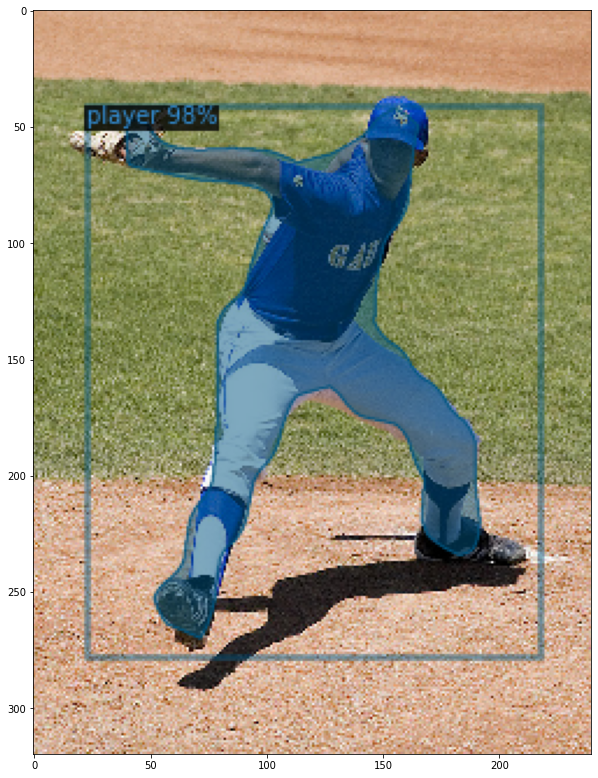

In [16]:
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
import os
import pickle
import cv2

cfg_save_path = '/content/drive/MyDrive/project_dataset/output_resnet101/IS_res101_cfg.pickle'

with open(cfg_save_path, 'rb') as f:
    cfg = pickle.load(f)

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, '/content/drive/MyDrive/project_dataset/output_resnet101/segmentation_res101/model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # set the custom testing threshold
predictor = DefaultPredictor(cfg)


def on_image(image_path, predictor):
    im = cv2.imread(image_path)
    outputs = predictor(im)
    v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5, instance_mode = ColorMode.SEGMENTATION)
    v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
    plt.figure(figsize=(10, 15))
    plt.imshow(v.get_image())
    plt.show()

image_path = '/content/drive/MyDrive/project_dataset/test/000000030239.jpg'
on_image(image_path, predictor)

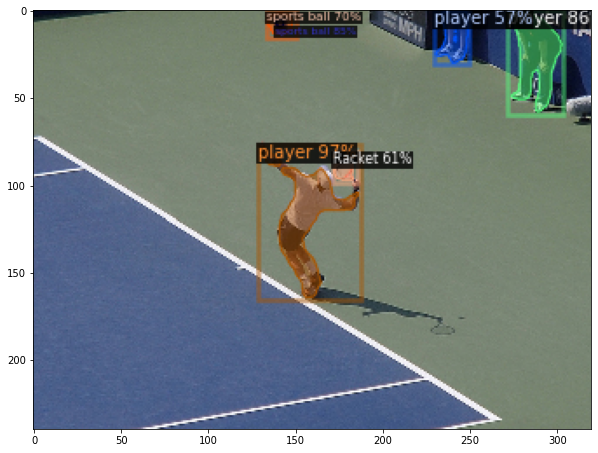

In [18]:
image_path = '/content/drive/MyDrive/project_dataset/test/000000034500.jpg'
on_image(image_path, predictor)

## Evaluation

In [22]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, '/content/drive/MyDrive/project_dataset/output_resnet101/segmentation_res101/model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # set the custom testing threshold
predictor = DefaultPredictor(cfg)

evaluator = COCOEvaluator(val_dataset_name, output_dir="/content/drive/MyDrive/project_dataset/output_resnet101/segmentation_res101")
val_loader = build_detection_test_loader(cfg, val_dataset_name)
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[09/25 23:16:55 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/project_dataset/sports_val.json
[09/25 23:16:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/25 23:16:55 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[09/25 23:16:55 d2.data.common]: Serialized dataset takes 0.07 MiB
[09/25 23:16:55 d2.evaluation.evaluator]: Start inference on 100 batches
[09/25 23:17:00 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0048 s/iter. Inference: 0.4302 s/iter. Eval: 0.0039 s/iter. Total: 0.4390 s/iter. ETA=0:00:39
[09/25 23:17:06 d2.evaluation.evaluator]: Inference done 24/100. Dataloading: 0.0032 s/iter. Inference: 0.4172 s/iter. Eval: 0.0041 s/iter. Total: 0.4250 s/iter. ETA=0:00:32
[09/25 23:17:11 d2.evaluation.evaluator]: Inference done 37/100. Dataloading: 0.0027 s/iter. In